In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [1]:
!pip install -q segmentation-models-pytorch

import os
import time
from glob import glob
from tqdm import tqdm

import cv2
import numpy as np
import pandas as pd
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
import albumentations as A
from scipy.ndimage.morphology import binary_dilation
import segmentation_models_pytorch as smp
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split

import torch
from torch.optim import Adam
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms as T

/opt/conda/lib/python3.10/site-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 1.4.22 (you have 1.4.21). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
/tmp/ipykernel_23/692059392.py:14: DeprecationWarning: Please import `binary_dilation` from the `scipy.ndimage` namespace; the `scipy.ndimage.morphology` namespace is deprecated and will be removed in SciPy 2.0.0.
  from scipy.ndimage.morphology import binary_dilation


In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [3]:
files_dir = '/kaggle/input/lgg-mri-segmentation/kaggle_3m'
file_paths = glob(f'{files_dir}/*/*[0-9].tif')

In [4]:
csv_path = '/kaggle/input/lgg-mri-segmentation/kaggle_3m/data.csv'
df = pd.read_csv(csv_path)

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 110 entries, 0 to 109
Data columns (total 18 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Patient                    110 non-null    object 
 1   RNASeqCluster              92 non-null     float64
 2   MethylationCluster         109 non-null    float64
 3   miRNACluster               110 non-null    int64  
 4   CNCluster                  108 non-null    float64
 5   RPPACluster                98 non-null     float64
 6   OncosignCluster            105 non-null    float64
 7   COCCluster                 110 non-null    int64  
 8   histological_type          109 non-null    float64
 9   neoplasm_histologic_grade  109 non-null    float64
 10  tumor_tissue_site          109 non-null    float64
 11  laterality                 109 non-null    float64
 12  tumor_location             109 non-null    float64
 13  gender                     109 non-null    float64

In [5]:
imputer = SimpleImputer(strategy="most_frequent")

df = pd.DataFrame(imputer.fit_transform(df), columns=df.columns)
df

,Patient,RNASeqCluster,MethylationCluster,miRNACluster,CNCluster,RPPACluster,OncosignCluster,COCCluster,histological_type,neoplasm_histologic_grade,tumor_tissue_site,laterality,tumor_location,gender,age_at_initial_pathologic,race,ethnicity,death01
0,TCGA_CS_4941,2.0,4.0,2,2.0,2.0,3.0,2,1.0,2.0,1.0,3.0,2.0,2.0,67.0,3.0,2.0,1.0
1,TCGA_CS_4942,1.0,5.0,2,1.0,1.0,2.0,1,1.0,2.0,1.0,3.0,2.0,1.0,44.0,2.0,2.0,1.0
2,TCGA_CS_4943,1.0,5.0,2,1.0,2.0,2.0,1,1.0,2.0,1.0,1.0,2.0,2.0,37.0,3.0,2.0,0.0
3,TCGA_CS_4944,2.0,5.0,2,1.0,2.0,1.0,1,1.0,1.0,1.0,3.0,6.0,2.0,50.0,3.0,2.0,0.0
4,TCGA_CS_5393,4.0,5.0,2,1.0,2.0,3.0,1,1.0,2.0,1.0,1.0,6.0,2.0,39.0,3.0,2.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105,TCGA_HT_8563,2.0,5.0,3,1.0,2.0,2.0,2,1.0,2.0,1.0,3.0,2.0,1.0,30.0,3.0,2.0,0.0
106,TCGA_HT_A5RC,2.0,4.0,2,2.0,2.0,3.0,2,1.0,2.0,1.0,1.0,2.0,1.0,70.0,3.0,2.0,1.0
107,TCGA_HT_A616,2.0,5.0,2,1.0,2.0,2.0,1,1.0,1.0,1.0,1.0,2.0,1.0,36.0,3.0,2.0,0.0
108,TCGA_HT_A61A,2.0,5.0,2,1.0,2.0,2.0,1,3.0,1.0,1.0,1.0,6.0,1.0,20.0,3.0,2.0,0.0


In [6]:
def get_file_row(path):
    """Produces ID of a patient, image and mask filenames from a particular path"""
    path_no_ext, ext = os.path.splitext(path)
    filename = os.path.basename(path)
    
    patient_id = '_'.join(filename.split('_')[:3]) # Patient ID in the csv file consists of 3 first filename segments
    
    return [patient_id, path, f'{path_no_ext}_mask{ext}']

In [7]:
# Show sample
get_file_row('/kaggle/input/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_45.tif')

['TCGA_DU_7010',
 '/kaggle/input/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_45.tif',
 '/kaggle/input/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_45_mask.tif']

In [8]:
filenames_df = pd.DataFrame((get_file_row(filename) for filename in file_paths), columns=['Patient', 'image_filename', 'mask_filename'])
filenames_df

,Patient,image_filename,mask_filename
0,TCGA_DU_7010,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...
1,TCGA_DU_7010,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...
2,TCGA_DU_7010,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...
3,TCGA_DU_7010,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...
4,TCGA_DU_7010,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...
...,...,...,...
3924,TCGA_DU_7306,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...
3925,TCGA_DU_7306,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...
3926,TCGA_DU_7306,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...
3927,TCGA_DU_7306,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...


In [9]:
class MriDataset(Dataset):
    def __init__(self, df, transform=None, mean=0.5, std=0.25):
        super(MriDataset, self).__init__()
        self.df = df
        self.transform = transform
        self.mean = mean
        self.std = std
        
        
    def __len__(self):
        return len(self.df)
        
    def __getitem__(self, idx, raw=False):
        row = self.df.iloc[idx]
        img = cv2.imread(row['image_filename'], cv2.IMREAD_UNCHANGED)
        mask = cv2.imread(row['mask_filename'], cv2.IMREAD_GRAYSCALE)
        if raw:
            return img, mask
        
        if self.transform:
            augmented = self.transform(image=img, mask=mask)
            image, mask = augmented['image'], augmented['mask']
        
        img = T.functional.to_tensor(img)
        mask = mask // 255
        mask = torch.Tensor(mask)
        return img, mask

In [10]:
df = pd.merge(df, filenames_df, on="Patient")

In [11]:
train_df, test_df = train_test_split(df, test_size=0.3)
test_df, valid_df = train_test_split(test_df, test_size=0.5)

In [12]:
transform = A.Compose([
    A.ChannelDropout(p=0.3),
    A.RandomBrightnessContrast(p=0.3),
    A.ColorJitter(p=0.3),
])

train_dataset = MriDataset(train_df, transform)
valid_dataset = MriDataset(valid_df)
test_dataset = MriDataset(test_df)

In [13]:
batch_size = 16

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
valid_loader = DataLoader(valid_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=1)

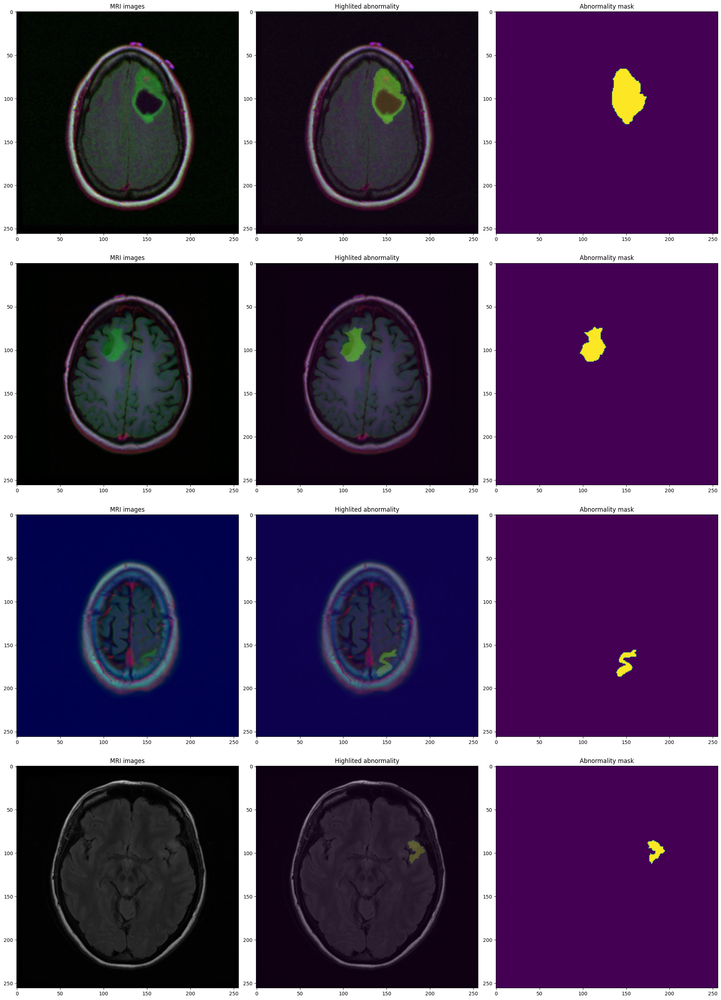

In [14]:
%matplotlib inline
n_examples = 4

fig, axs = plt.subplots(n_examples, 3, figsize=(20, n_examples*7), constrained_layout=True)
i = 0
for ax in axs:
    while True:
        image, mask = train_dataset.__getitem__(i, raw=True)
        i += 1
        if np.any(mask): 
            ax[0].set_title("MRI images")
            ax[0].imshow(image)
            ax[1].set_title("Highlited abnormality")
            ax[1].imshow(image)
            ax[1].imshow(mask, alpha=0.2)
            ax[2].imshow(mask)
            ax[2].set_title("Abnormality mask")
            break

In [15]:
class EarlyStopping():
    """
    Stops training when loss stops decreasing in a PyTorch module.
    """
    def __init__(self, patience:int = 6, min_delta: float = 0, weights_path: str = 'weights.pt'):
        """
        :param patience: number of epochs of non-decreasing loss before stopping
        :param min_delta: minimum difference between best and new loss that is considered
            an improvement
        :paran weights_path: Path to the file that should store the model's weights
        """
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.best_loss = float('inf')
        self.weights_path = weights_path

    def __call__(self, val_loss: float, model: torch.nn.Module):
        if self.best_loss - val_loss > self.min_delta:
            self.best_loss = val_loss
            torch.save(model.state_dict(), self.weights_path)
            self.counter = 0
        else:
            self.counter += 1
            if self.counter >= self.patience:
                return True
        return False

    def load_weights(self, model: torch.nn.Module):
        """
        Loads weights of the best model.
        :param model: model to which the weigths should be loaded
        """
        return model.load_state_dict(torch.load(self.weights_path, weights_only=True))

In [16]:
def iou_pytorch(predictions: torch.Tensor, labels: torch.Tensor, e: float = 1e-7):
    """Calculates Intersection over Union for a tensor of predictions"""
    predictions = torch.where(predictions > 0.5, 1, 0)
    labels = labels.byte()
    
    intersection = (predictions & labels).float().sum((1, 2))
    union = (predictions | labels).float().sum((1, 2))
    
    iou = (intersection + e) / (union + e)
    return iou

def dice_pytorch(predictions: torch.Tensor, labels: torch.Tensor, e: float = 1e-7):
    """Calculates Dice coefficient for a tensor of predictions"""
    predictions = torch.where(predictions > 0.5, 1, 0)
    labels = labels.byte()
    
    intersection = (predictions & labels).float().sum((1, 2))
    return ((2 * intersection) + e) / (predictions.float().sum((1, 2)) + labels.float().sum((1, 2)) + e)

In [17]:
def BCE_dice(output, target, alpha=0.01):
    bce = torch.nn.functional.binary_cross_entropy(output, target)
    soft_dice = 1 - dice_pytorch(output, target).mean()
    return bce + alpha * soft_dice

In [18]:
model = smp.Unet(
    encoder_name="efficientnet-b7",
    encoder_weights="imagenet",
    in_channels=3,
    classes=1,
    activation='sigmoid',
)
model.to(device);

Downloading: "https://github.com/lukemelas/EfficientNet-PyTorch/releases/download/1.0/efficientnet-b7-dcc49843.pth" to /root/.cache/torch/hub/checkpoints/efficientnet-b7-dcc49843.pth
100%|██████████| 254M/254M [00:01<00:00, 235MB/s]  


In [19]:
def training_loop(epochs, model, train_loader, valid_loader, optimizer, loss_fn, lr_scheduler):
    history = {'train_loss': [], 'val_loss': [], 'val_IoU': [], 'val_dice': []}
    early_stopping = EarlyStopping(patience=7)
    
    for epoch in range(1, epochs + 1):
        start_time = time.time()
        
        running_loss = 0
        model.train()
        for i, data in enumerate(tqdm(train_loader)):
            img, mask = data
            img, mask = img.to(device), mask.to(device)
            predictions = model(img)
            predictions = predictions.squeeze(1)
            loss = loss_fn(predictions, mask)
            running_loss += loss.item() * img.size(0)
            loss.backward()
            optimizer.step()
            optimizer.zero_grad()
        
        model.eval()
        with torch.no_grad():
            running_IoU = 0
            running_dice = 0
            running_valid_loss = 0
            for i, data in enumerate(valid_loader):
                img, mask = data
                img, mask = img.to(device), mask.to(device)
                predictions = model(img)
                predictions = predictions.squeeze(1)
                running_dice += dice_pytorch(predictions, mask).sum().item()
                running_IoU += iou_pytorch(predictions, mask).sum().item()
                loss = loss_fn(predictions, mask)
                running_valid_loss += loss.item() * img.size(0)
        train_loss = running_loss / len(train_loader.dataset)
        val_loss = running_valid_loss / len(valid_loader.dataset)
        val_dice = running_dice / len(valid_loader.dataset)
        val_IoU = running_IoU / len(valid_loader.dataset)
        
        history['train_loss'].append(train_loss)
        history['val_loss'].append(val_loss)
        history['val_IoU'].append(val_IoU)
        history['val_dice'].append(val_dice)
        print(f'Epoch: {epoch}/{epochs} | Training loss: {train_loss} | Validation loss: {val_loss} | Validation Mean IoU: {val_IoU} '
         f'| Validation Dice coefficient: {val_dice}')
        
        lr_scheduler.step(val_loss)
        if early_stopping(val_loss, model):
            early_stopping.load_weights(model)
            break
    model.eval()
    return history

In [20]:
loss_fn = BCE_dice
optimizer = Adam(model.parameters(), lr=0.001)
epochs = 20
lr_scheduler = ReduceLROnPlateau(optimizer=optimizer, patience=2,factor=0.2)

history = training_loop(epochs, model, train_loader, valid_loader, optimizer, loss_fn, lr_scheduler)

100%|██████████| 172/172 [03:17<00:00,  1.15s/it]


Epoch: 1/20 | Training loss: 0.07817918726260012 | Validation loss: 0.04687930486970029 | Validation Mean IoU: 0.5972213842101016 | Validation Dice coefficient: 0.6365661968619136


100%|██████████| 172/172 [03:13<00:00,  1.12s/it]


Epoch: 2/20 | Training loss: 0.01356338725916364 | Validation loss: 0.024462506339206533 | Validation Mean IoU: 0.7686551756778006 | Validation Dice coefficient: 0.8090199906947249


100%|██████████| 172/172 [03:12<00:00,  1.12s/it]


Epoch: 3/20 | Training loss: 0.009419528538530524 | Validation loss: 0.00886114901563121 | Validation Mean IoU: 0.8489482831146757 | Validation Dice coefficient: 0.8807613065687276


100%|██████████| 172/172 [03:12<00:00,  1.12s/it]


Epoch: 4/20 | Training loss: 0.006965985851193016 | Validation loss: 0.008763552731755426 | Validation Mean IoU: 0.8540224026825468 | Validation Dice coefficient: 0.8856198795771195


100%|██████████| 172/172 [03:13<00:00,  1.13s/it]


Epoch: 5/20 | Training loss: 0.005913591487163847 | Validation loss: 0.007501935156977783 | Validation Mean IoU: 0.8698212397300591 | Validation Dice coefficient: 0.8997158454636396


100%|██████████| 172/172 [03:13<00:00,  1.12s/it]


Epoch: 6/20 | Training loss: 0.005052954595197331 | Validation loss: 0.0065190305562405765 | Validation Mean IoU: 0.8886258771864034 | Validation Dice coefficient: 0.9166502047393281


100%|██████████| 172/172 [03:12<00:00,  1.12s/it]


Epoch: 7/20 | Training loss: 0.004322831039401618 | Validation loss: 0.006092916050199735 | Validation Mean IoU: 0.8902682595333811 | Validation Dice coefficient: 0.9189341771400581


100%|██████████| 172/172 [03:13<00:00,  1.12s/it]


Epoch: 8/20 | Training loss: 0.003889736644923687 | Validation loss: 0.006177245433268658 | Validation Mean IoU: 0.9042774442899025 | Validation Dice coefficient: 0.9311050479694948


100%|██████████| 172/172 [03:12<00:00,  1.12s/it]


Epoch: 9/20 | Training loss: 0.0037413763094016096 | Validation loss: 0.006309078665355504 | Validation Mean IoU: 0.8917762724019713 | Validation Dice coefficient: 0.9202529939554506


100%|██████████| 172/172 [03:12<00:00,  1.12s/it]


Epoch: 10/20 | Training loss: 0.003426516470753334 | Validation loss: 0.006673460851533938 | Validation Mean IoU: 0.8883305549621582 | Validation Dice coefficient: 0.9152853513168077


100%|██████████| 172/172 [03:13<00:00,  1.13s/it]


Epoch: 11/20 | Training loss: 0.0029325859799811784 | Validation loss: 0.005891370012472242 | Validation Mean IoU: 0.9009827274387165 | Validation Dice coefficient: 0.9273012306730626


100%|██████████| 172/172 [03:13<00:00,  1.13s/it]


Epoch: 12/20 | Training loss: 0.002682056009430777 | Validation loss: 0.0059194701305448506 | Validation Mean IoU: 0.9085134296093957 | Validation Dice coefficient: 0.9345746557591326


100%|██████████| 172/172 [03:13<00:00,  1.12s/it]


Epoch: 13/20 | Training loss: 0.002584272575480017 | Validation loss: 0.0059192694202696875 | Validation Mean IoU: 0.9054206638012903 | Validation Dice coefficient: 0.9314935409416587


100%|██████████| 172/172 [03:12<00:00,  1.12s/it]


Epoch: 14/20 | Training loss: 0.00250928172333674 | Validation loss: 0.006062281111223718 | Validation Mean IoU: 0.9058116023823366 | Validation Dice coefficient: 0.9321981672513283


100%|██████████| 172/172 [03:13<00:00,  1.12s/it]


Epoch: 15/20 | Training loss: 0.002443628988313404 | Validation loss: 0.006067550015020169 | Validation Mean IoU: 0.9093808109477415 | Validation Dice coefficient: 0.9357329627214852


100%|██████████| 172/172 [03:12<00:00,  1.12s/it]


Epoch: 16/20 | Training loss: 0.0024049553159963 | Validation loss: 0.006057392256492275 | Validation Mean IoU: 0.9043443728301485 | Validation Dice coefficient: 0.9307507676593328


100%|██████████| 172/172 [03:13<00:00,  1.12s/it]


Epoch: 17/20 | Training loss: 0.0024068553679707375 | Validation loss: 0.006036332126517417 | Validation Mean IoU: 0.904099708492473 | Validation Dice coefficient: 0.9305378477452165


100%|██████████| 172/172 [03:13<00:00,  1.13s/it]


Epoch: 18/20 | Training loss: 0.002379751983522014 | Validation loss: 0.0060328291429175155 | Validation Mean IoU: 0.9057012897426799 | Validation Dice coefficient: 0.9321435346441754


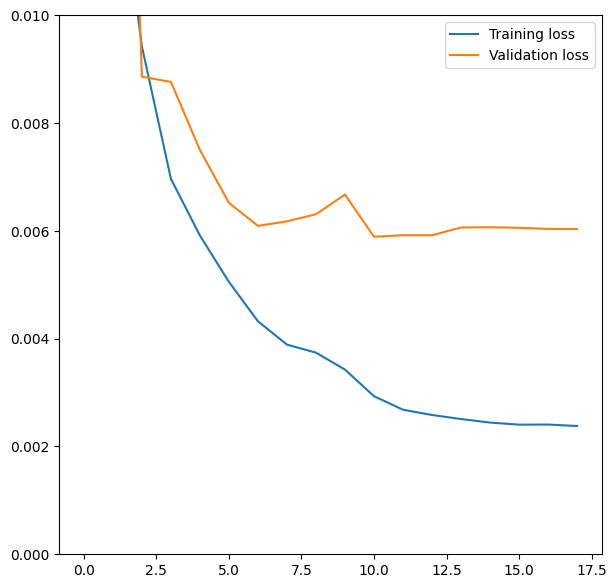

In [21]:
plt.figure(figsize=(7, 7))
plt.plot(history['train_loss'], label='Training loss')
plt.plot(history['val_loss'], label='Validation loss')
plt.ylim(0, 0.01)
plt.legend()
plt.show()

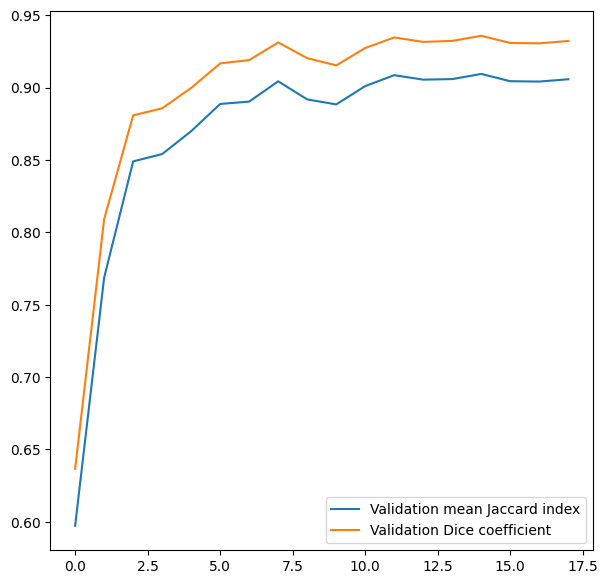

In [22]:
plt.figure(figsize=(7, 7))
plt.plot(history['val_IoU'], label='Validation mean Jaccard index')
plt.plot(history['val_dice'], label='Validation Dice coefficient')
plt.legend()
plt.show()


In [23]:
with torch.no_grad():
    running_IoU = 0
    running_dice = 0
    running_loss = 0
    for i, data in enumerate(test_loader):
        img, mask = data
        img, mask = img.to(device), mask.to(device)
        predictions = model(img)
        predictions = predictions.squeeze(1)
        running_dice += dice_pytorch(predictions, mask).sum().item()
        running_IoU += iou_pytorch(predictions, mask).sum().item()
        loss = loss_fn(predictions, mask)
        running_loss += loss.item() * img.size(0)
    loss = running_loss / len(test_dataset)
    dice = running_dice / len(test_dataset)
    IoU = running_IoU / len(test_dataset)
    
    print(f'Tests: loss: {loss} | Mean IoU: {IoU} | Dice coefficient: {dice}')

Tests: loss: 0.005624842690400276 | Mean IoU: 0.9065227187283595 | Dice coefficient: 0.9335294885816128


In [24]:
with torch.no_grad():
    running_IoU = 0
    running_dice = 0
    running_loss = 0
    running_correct_pixels = 0
    running_total_pixels = 0

    for i, data in enumerate(test_loader):
        img, mask = data
        img, mask = img.to(device), mask.to(device)
        predictions = model(img)
        predictions = predictions.squeeze(1)
        
        # Compute Dice and IoU
        running_dice += dice_pytorch(predictions, mask).sum().item()
        running_IoU += iou_pytorch(predictions, mask).sum().item()
        
        # Compute loss
        loss = loss_fn(predictions, mask)
        running_loss += loss.item() * img.size(0)
        
        # Threshold predictions to binary
        binary_predictions = (predictions > 0.5).float()
        
        # Calculate accuracy
        running_correct_pixels += (binary_predictions == mask).sum().item()
        running_total_pixels += mask.numel()

    # Calculate metrics
    loss = running_loss / len(test_dataset)
    dice = running_dice / len(test_dataset)
    IoU = running_IoU / len(test_dataset)
    accuracy = running_correct_pixels / running_total_pixels  # Accuracy calculation

    print(f'Tests: loss: {loss} | Mean IoU: {IoU} | Dice coefficient: {dice} | Accuracy: {accuracy}')


Tests: loss: 0.005624842690400276 | Mean IoU: 0.9065227187283595 | Dice coefficient: 0.9335294885816128 | Accuracy: 0.99825363288711


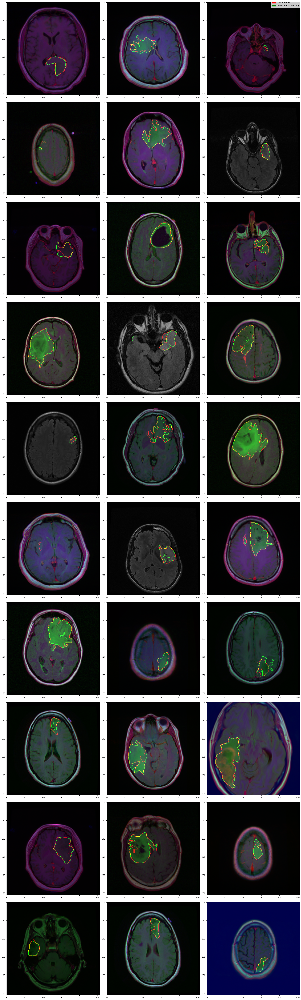

In [25]:
%matplotlib inline

width = 3
columns = 10
n_examples = columns * width

fig, axs = plt.subplots(columns, width, figsize=(7*width , 7*columns), constrained_layout=True)
red_patch = mpatches.Patch(color='red', label='The red data')
fig.legend(loc='upper right',handles=[
    mpatches.Patch(color='red', label='Ground truth'),
    mpatches.Patch(color='green', label='Predicted abnormality')])
i = 0
with torch.no_grad():
    for data in test_loader:
        image, mask = data
        mask = mask[0]
        if not mask.byte().any():
            continue
        image = image.to(device)
        prediction = model(image).to('cpu')[0][0]
        prediction = torch.where(prediction > 0.5, 1, 0)
        prediction_edges = prediction - binary_dilation(prediction)
        ground_truth = mask - binary_dilation(mask)
        image[0, 0, ground_truth.bool()] = 1
        image[0, 1, prediction_edges.bool()] = 1
        
        axs[i//width][i%width].imshow(image[0].to('cpu').permute(1, 2, 0))
        if n_examples == i + 1:
            break
        i += 1